:::{index} single: Report writing
:::
:::{index} single: Simulations; Report writing
:::
:::{index} single: Scenarios; Report writing
:::
:::{index} single: Simulations; the keep option
:::

:::{index} single: Scenarios; the Keep option
:::

:::{index} single: Keep; the Keep option to retain scenario results
:::



In [1]:
#This is code to manage dependencies if the notebook is executed in the google colab cloud service
if 'google.colab' in str(get_ipython()):
  import os
  os.system('apt -qqq install graphviz')
  os.system('pip -qqq install ModelFlowIb ipysheet  --no-dependencies ')


In [2]:
# Prepare the notebook for use of modelflow 

# Jupyter magic command to improve the display of charts in the Notebook
%matplotlib inline

# Import pandas 
import pandas as pd

# Import the model class from the modelclass module 
from modelclass import model 

# functions that improve rendering of modelflow outputs
model.widescreen()
model.scroll_off();

<IPython.core.display.Javascript object>

# Report writing and scenario results

`ModelFlow`, standard pandas routines and other python libraries like `Matplotlib` and `Plotly` can be used to visualize and compare dataframes and therefore the results from scenarios -- as indeed has been done in the preceding chapter. 

In addition, `ModelFlow` also provides several specific routines that make such comparisons easier.

## Load model object and simulation results from Scenario Analysis Chapter
To begin, we load the solution file that was saved at the end of the previous chapter, using the by now familiar modelload function.  Because the simulations performed in the previous chapter used the keep option, and because we saved the `mpakwScenarios.pcim` file with the keep option set to true, we will have access to all the simulation results from the previous chapter.

In [3]:
mpak,_ = model.modelload(r'..\models\mpakwScenarios.pcim', run=True)
mpak.smpl(2020,2040);

file read:  C:\mflow\papers\mfbook\content\models\mpakwScenarios.pcim




## The Keep option

The **Keep** option facilitates the comparison of results from different scenarios run on a give model object.  In each of the simulations executed in the previous chapter, the `keep` option was activated. This caused the results from each simulation to be stored in the model object in a `DataFrame` that can be identified by the descriptor given to it.  

### The keep_variables option
By default all variables are kept, if the user wishes to restrict the kept variables to a sub-set, they can do so by setting the **keep_variables** when the simulation is run, where 

For example:

```mpak(CTempExogAllKG,2020,2040,keep='2.5% increase in C 2025-27 -- exog whole period --KG=True',keep_variables='PAKNYGDPMKTPKN PAKNE*KN PAKEM*') ```

would run a simulation between 2020 AND 2040 CALLED 2.**5% increase in C 2025-27 -- exog whole period --KG=True** but keep only the variables that matched the search string in keep_variables.

By the same token, any search criteria could be used to define the set of keep_variables, for example:

`keep_variables='#MyGroup'` would cause the system to retain the variables designated in that group, or
`keep_variables='!*invest*'` would cause the system to retain the variables whose descriptions matched the search string *invest*.


:::{index} single: Simulations; Report-writing - the keep_plot method
:::
:::{index} single: Scenarios; Report-writing - the keep_plot method
:::
:::{index} single: Keep_solution dictionary
:::
:::{index} pair: Keep_solution; keep_variables
:::





## The `.keep_plot()` method

The keep_plot method can be used to plot and compare results from the various scenarios that had been run earlier using the `keep=` option. 

By default the results across all scenarios for each selected variables will be shown on one chart at a time.  NB: the 2020,2040 restricts output to the period 2020 2040 the period over which the shocks were run.  Without that the graphs would display for the whole time period defined in the `model object` `mpak`.


In [4]:
mpak.keep_solutions


{'Baseline':       ADAP  ALBNEIMPGNFSKD  ALBNEIMPGNFSKD01  AUTNEIMPGNFSKD   
 1980     0      655.959991        655.959991    57235.583413  \
 1981     0      657.440879        657.440879    56888.545640   
 1982     0      773.473829        773.473829    54824.093028   
 1983     0      662.950925        662.950925    57114.045613   
 1984     0      597.058556        597.058556    60908.310421   
 ...    ...             ...               ...             ...   
 2096     0        0.000000          0.000000        0.000000   
 2097     0        0.000000          0.000000        0.000000   
 2098     0        0.000000          0.000000        0.000000   
 2099     0        0.000000          0.000000        0.000000   
 2100     0        0.000000          0.000000        0.000000   
 
       AUTNEIMPGNFSKD01  BELNEIMPGNFSKD  BELNEIMPGNFSKD01  BIHNEIMPGNFSKD   
 1980      57235.583413   110340.519687     110340.519687             0.0  \
 1981      56888.545640   108205.205228     108205.2

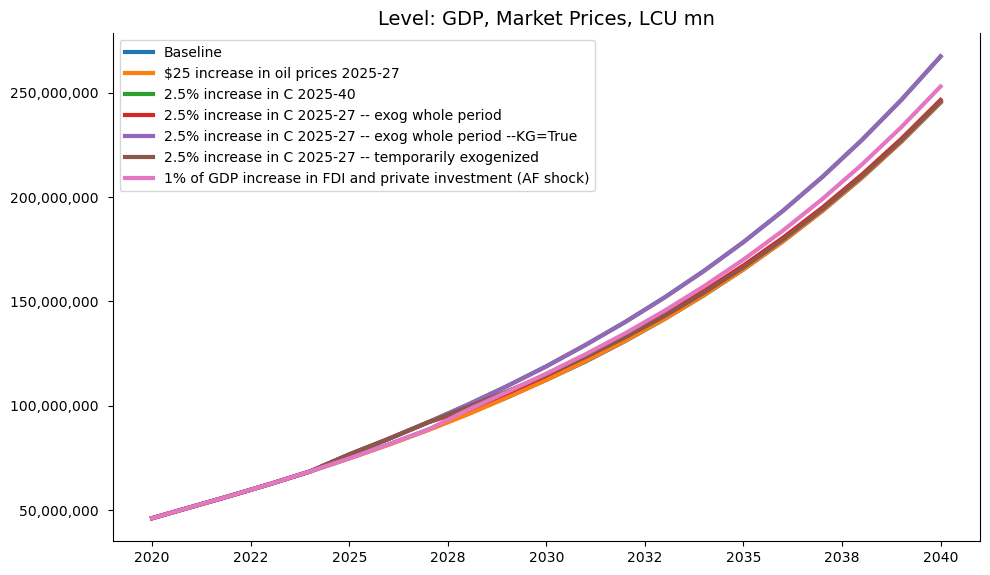

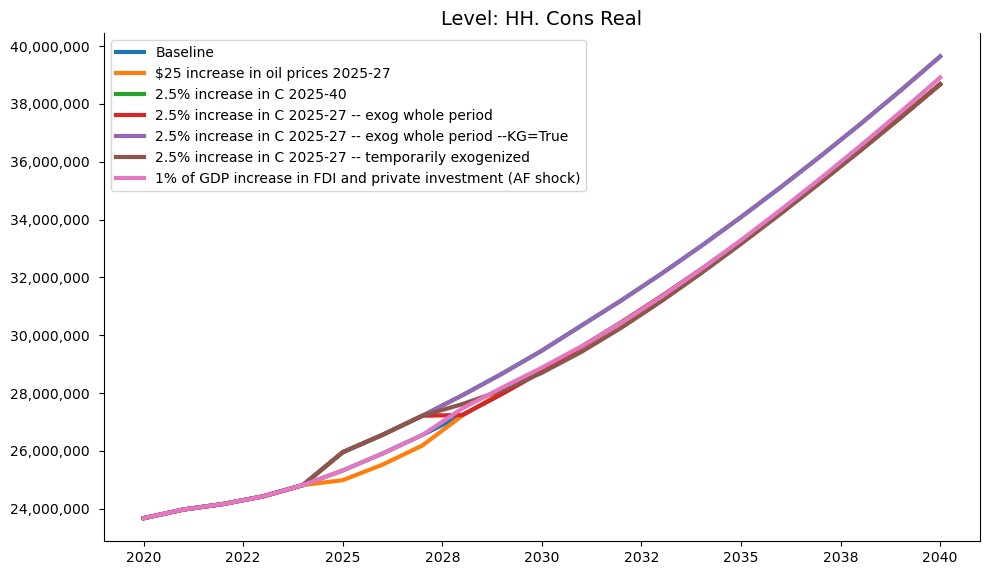

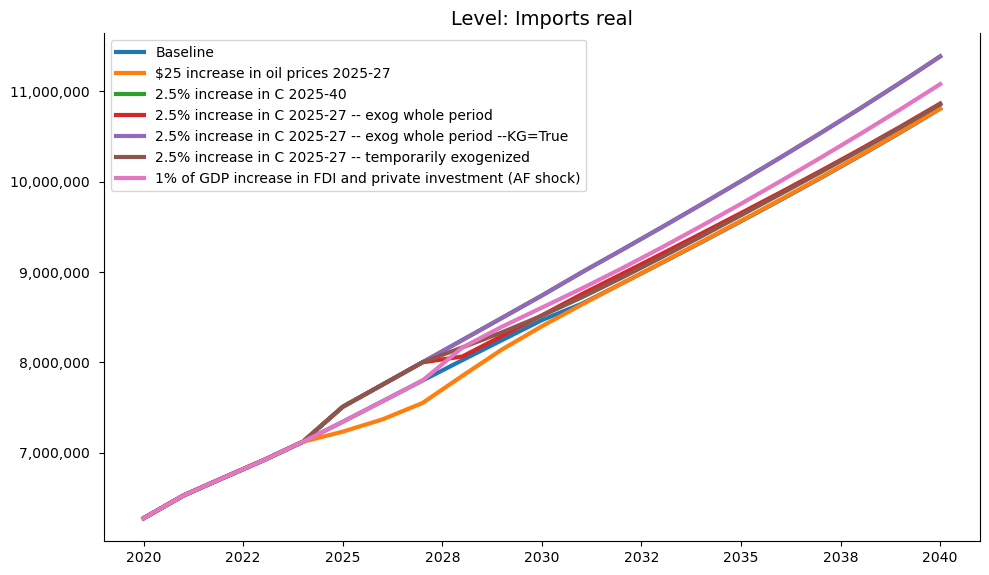

In [3]:
mpak.keep_plot('PAKNYGDPMKTPCN PAKNECONPRVTKN PAKNEIMPGNFSKN',2020,2040,  legend=True);
#show for each variable on a separate chart the results from each kept scenario

:::{index} single: Scenarios; report-writing - keep_plot options
:::
:::{index} single: Simulations; report-writing - keep_plot options
:::
:::{index} single: Keep_plot; options
:::



### `keep_plot()` options


|options|arguments|example|Explanation|
|:--|:--|:--|:--|
|**variables**|list of variable mnemonics or search critiera|variables='PAKNE\*KN'|Defines the variables to be retained after the simulation|
|start, end|a date|start=2020;end=2040| Restricts output to the time-period indicated|
|showtype|'level';'growth';'change' $\Delta$| showtype="growth"| Displays the plot using the level, growth rate or change in the variable|
|legend|True, False|Legend=True| True:Legend placed inside the graph; False: Legend follows graph  |
| diff |True; False (default) |True; graphs are expressed as the difference with respect to the first scenario in the kept library|
| diffpct |True; False (default) |True; graphs are expressed as the percent difference with respect to the first scenario in the kept Library|
| savefig|savfig='..charts/figure17.jpg'|The extension determiens thefile format of the saved file: ```pdf```, ```svg``` and ```png``` are the most common extensions.| Creates one file for each figure generated by the command.|
 
 :::{note}
`'keep_plot()` and `.keep_plot_multi()` return a python object that points to the in memory version of the rendered figure(s).  This object can be used to modify the graph (see examples towards the end of this chapter).
 
 :::
 
:::{index} single: Keep_plot; savefig 
::: 
 
 

:::{index} single: Scenarios: Keep_plot examples - the diff option
:::
:::{index} single: Simulations: Keep_plot examples - the diff option
:::
:::{index} single: Keep_plot; examples - the diff option
:::

### An example using the diff=True option

When `diff=True` (or 1) results from all kept scenarioswill be presented as the level change in selected variables with respect to the first scenario. -- in this instance the scenario saved with the name `baseline`.  

:::{warning}
Note in this instance `baseline` and `basedf` are the same because they were defined that way.  However, there is nothing in the system that guarantees that the first `keep` scenario will be the baseline or the `basedf` scenario.
:::

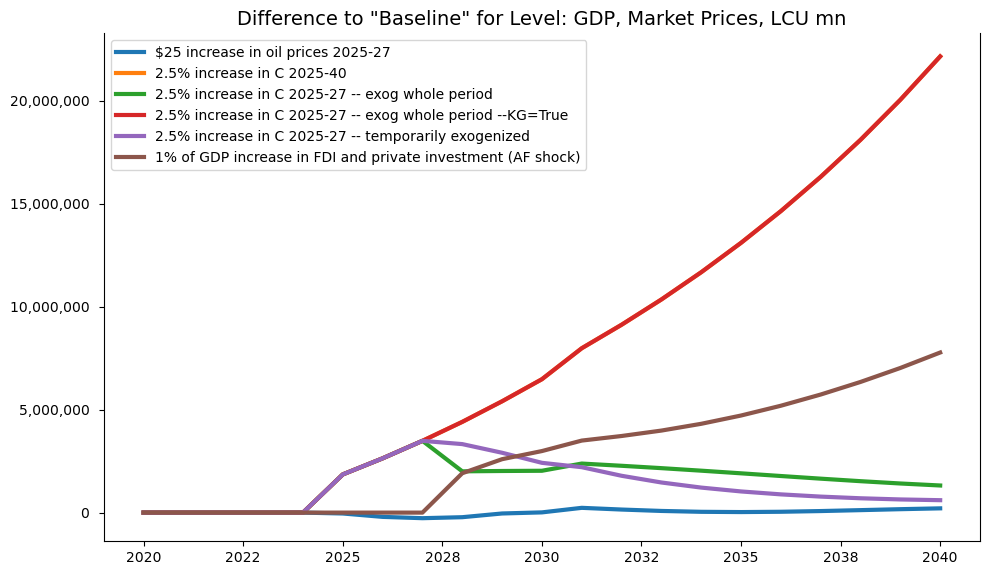

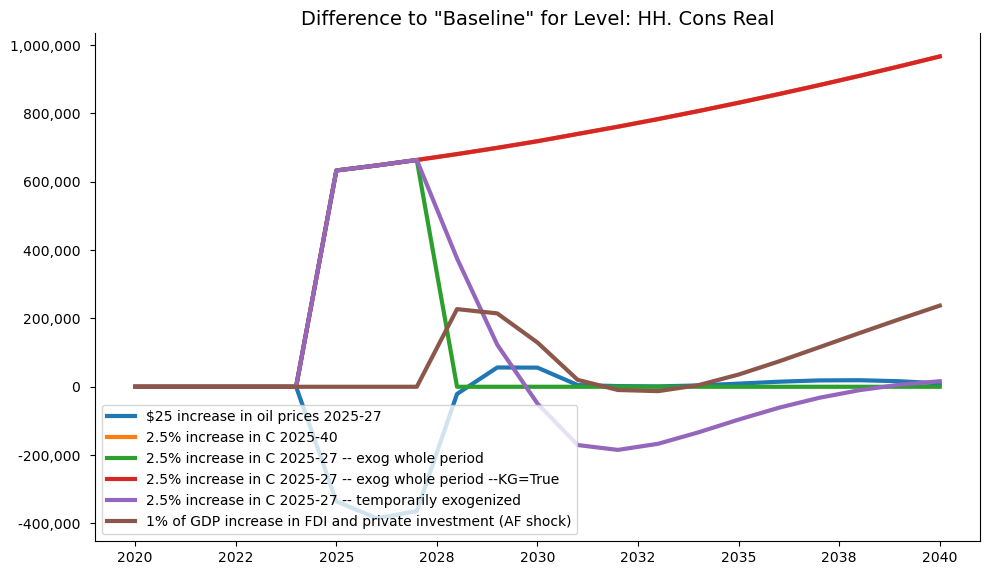

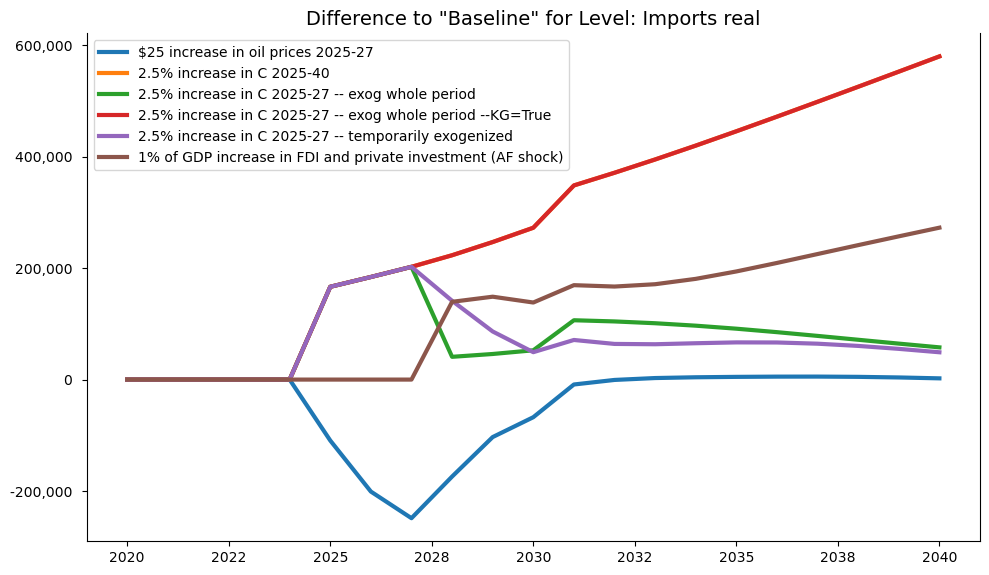

In [4]:
#Set the default period for the mpak object to 2020 2040
# because of this future calls to keep_plot or anyother model objkect method
# will operate over the period 2020 2040 only.
mpak.smpl(2020,2040) 
mpak.keep_plot('PAKNYGDPMKTPCN PAKNECONPRVTKN PAKNEIMPGNFSKN', diff=1, legend=True);

:::{index} single: Scenarios; Keep_plot examples - showtype=growth
:::
:::{index} single: Simulations; Keep_plot examples - showtype=growth
:::
:::{index} single: Keep_plot; examples - showtype=growth
:::

### The `showtype` option

In this example the difference with respect first `'keep` scenario `baseline` values are once again shown. This time the `showtype` option has been set to `growth`.  As a result the data is displayed as the  difference in the growth rates between the simulation scenarios and the growth rate in the `baseline` scenario -- remembering that keep_plot is calculating the differences with respect to the first kept scenario. Its name need not have been baseline, this was just a decision made in preparing the shocks that facilitated the kind of comparisons to be displayed. 

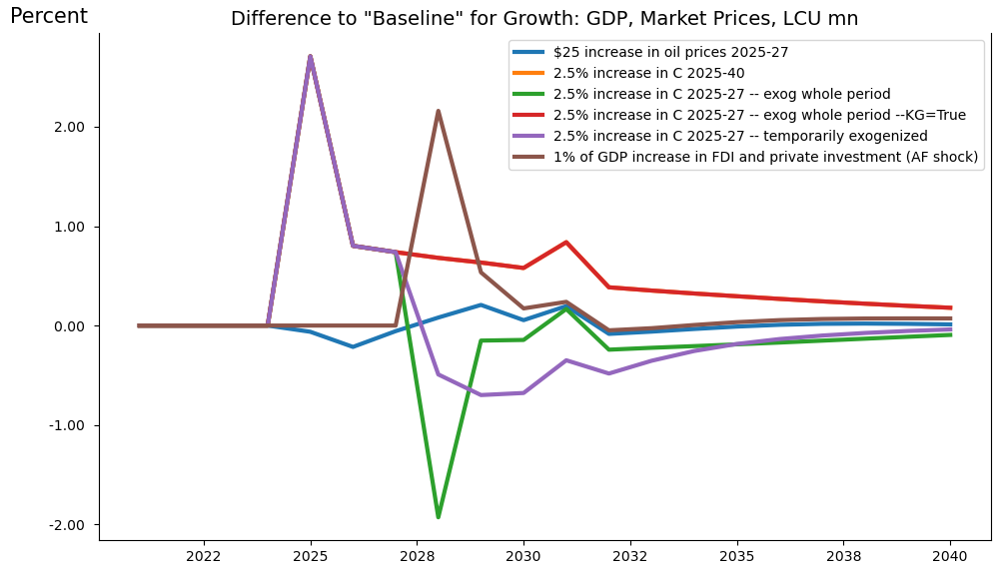

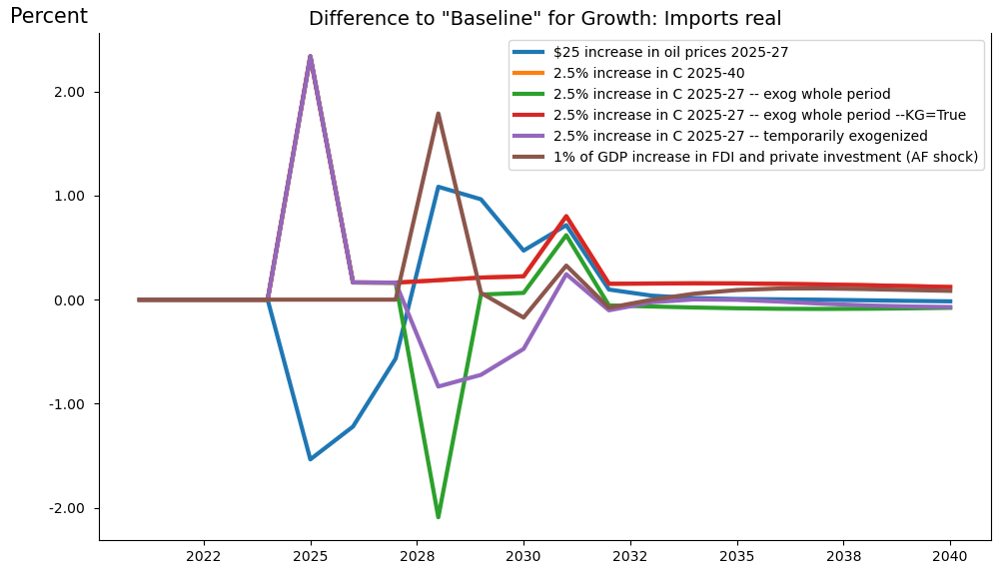

In [5]:
mpak.keep_plot('PAKNYGDPMKTPCN PAKNEIMPGNFSKN', diff=1,showtype='growth', legend=True);


:::{index} single: Scenarios; Keep_plot examples - showtype=diffpct
:::
:::{index} single: Simulations; Keep_plot examples - showtype=diffpct
:::
:::{index} single: Keep_plot; examples - showtype=diffpct
:::



### The diffpct option

Setting `diffpct=True` instructs `.keep_plot()` to display the data as a percent deviation from the first `kept` scenario, which in this case was the baseline scenario.
$\big(\frac{x_{shock}-x_{original}}{x_{shock}}\big) * 100$

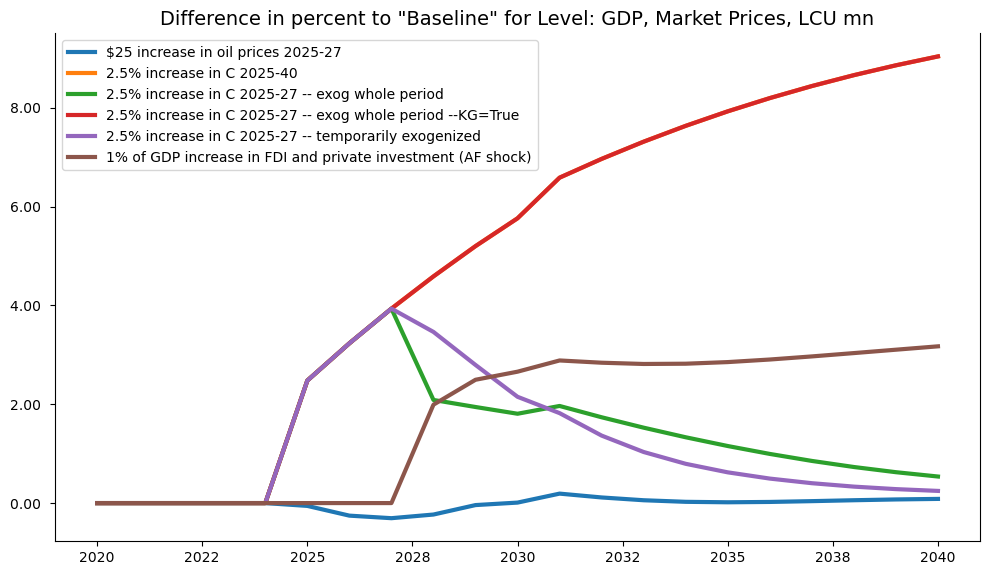

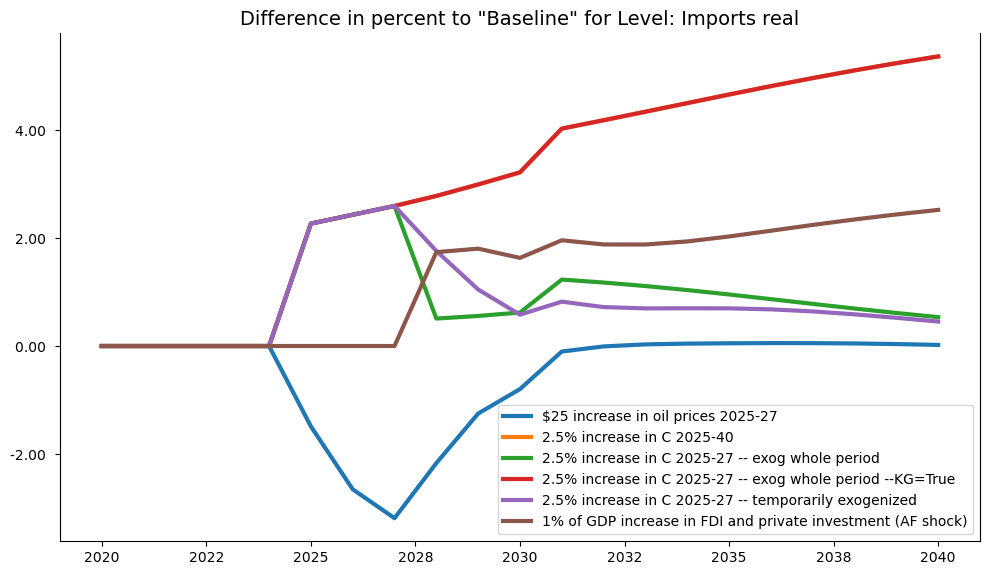

In [6]:
mpak.keep_plot('PAKNYGDPMKTPCN  PAKNEIMPGNFSKN', diffpct=True,showtype='level',legend="Change in level as a % of first keep scenario");




:::{index} single: keep_solutions.keys()
:::
:::{index} single: Simulations; keep_plot options -- keep_switch -- specify the kept scenarios to be displayed
:::
:::{index} single: Compare solutions; keep_plot options -- keep_switch -- specify the kept scenarios to be displayed
:::

:::{index} single: keep_plot options; keep_switch -- specify the kept scenarios to be displayed
:::


### The `.keep_switch()` method

The `.keep_switch()` method restricts the number of scenarios on which subsequent calls to `.keep_plot()` (and `.keep_plot_multi()`) are executed on.  `.keep_switch()` can be passed a list of scenarios or using a wildcard selector.

#### The `.keep_solutions.keys()` method 
The `.keep_solutions.keys()` method displays a list of the solutions that have been kept previously.

In [7]:
mpak.keep_solutions.keys()


dict_keys(['Baseline', '$25 increase in oil prices 2025-27', '2.5% increase in C 2025-40', '2.5% increase in C 2025-27 -- exog whole period', '2.5% increase in C 2025-27 -- exog whole period --KG=True', '2.5% increase in C 2025-27 -- temporarily exogenized', '1% of GDP increase in FDI and private investment (AF shock)'])

To specify exactly which scenarios to show in a keep_plot, the `scenarios=` option of `.keepswitch()` must be initialized with a "|" delimited string of the names of the scenarios (retrieved above) that are to be displayed.

By placing the `.keepswitch()` in a `with` clause the scenario restriction will only apply to indented lines that follow the with construct.

As before the scenarios are compared with the first scenario in the keep dictionary, which in this instance happens to be named 'baseline'.

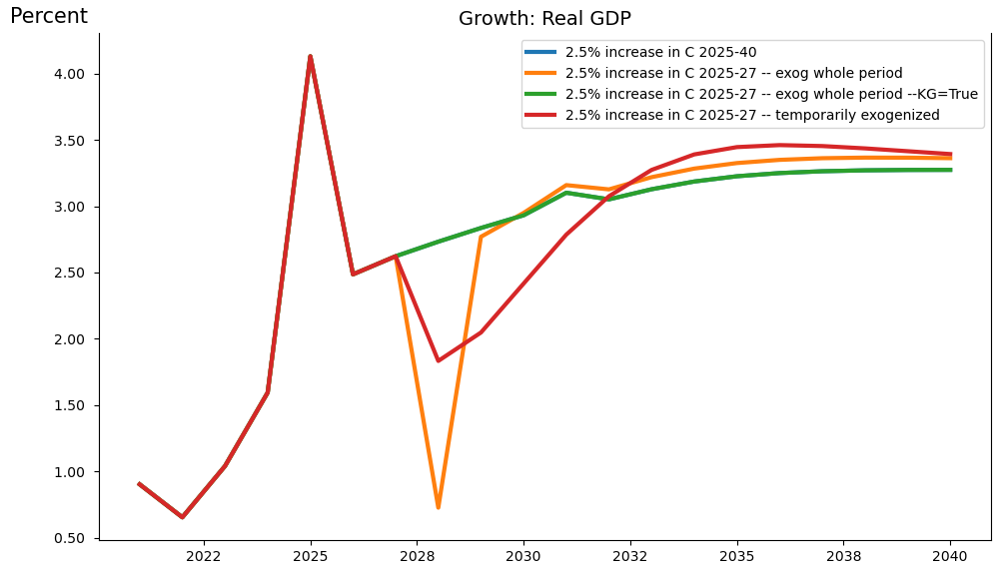

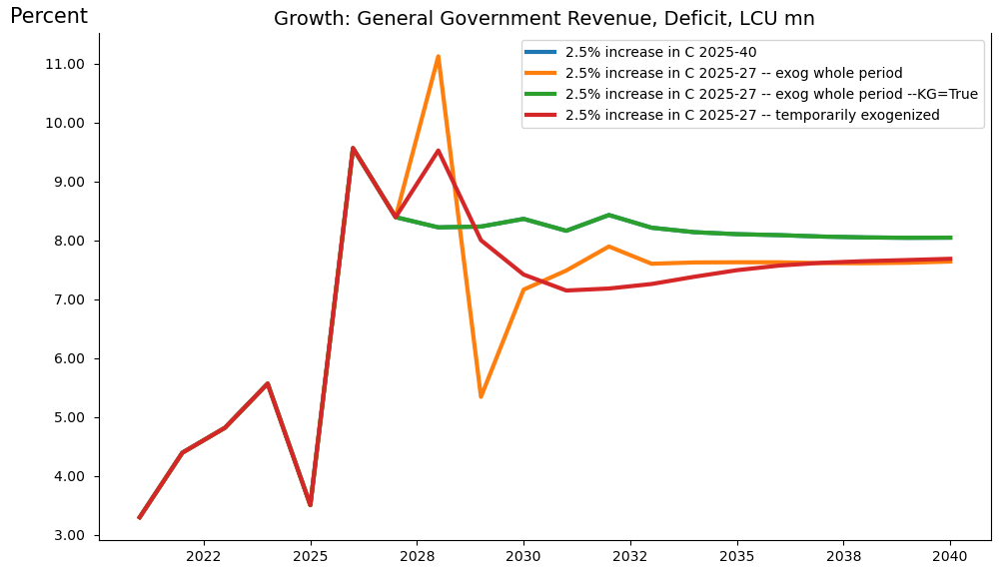

In [8]:

with mpak.keepswitch(scenarios='2.5% increase in C 2025-40|2.5% increase in C 2025-27 -- exog whole period|2.5% increase in C 2025-27 -- exog whole period --KG=True|2.5% increase in C 2025-27 -- temporarily exogenized'):
    mpak.keep_plot('PAKNYGDPMKTPKN PAKGGBALOVRLCN PAKGGDEBTTOTLCN',start=2020,end=2040,diff=False,showtype='growth',legend=True);

:::{index} single: keep_switch; selection using wildcard
:::
:::{index} single: Simulations; Compare solutions - keep_switch with wildcard
:::
:::{index} single: Scenarios; Compare solutions - keep_switch with wildcard
:::



##### The `.keep_solutions.keys()` method with diff=True

If .keep_plot() is called on a sub-set of the kept solutions, the comparison will be made relative to the first scenario in the .keep_switch call.

Thus in the example below (which repeats the previous call, but sets diff=True, all of the shocks are calculated relative to the shock named '2.5% increase in C 2025-40'.  Thus there are only three lines (not four as when diff=False).



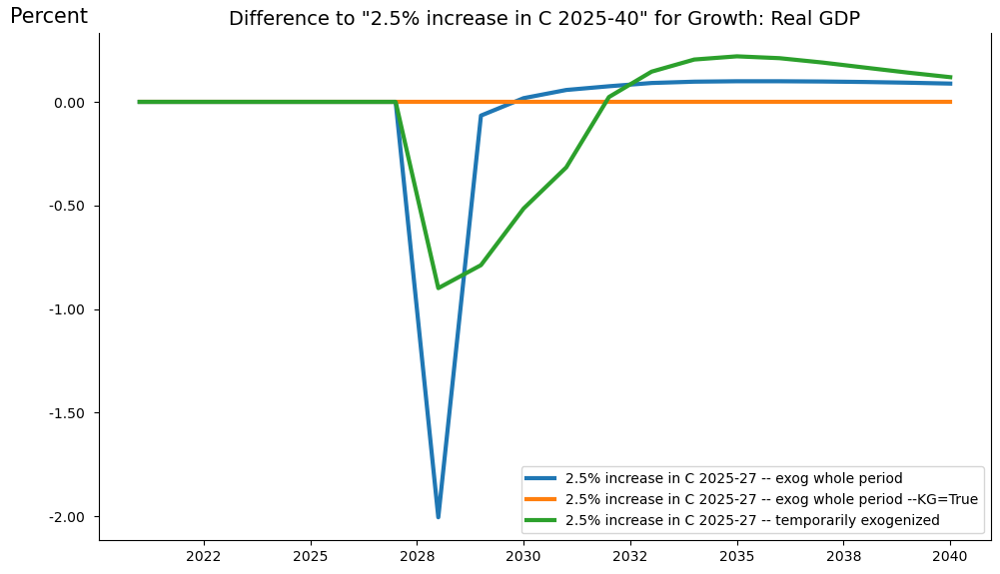

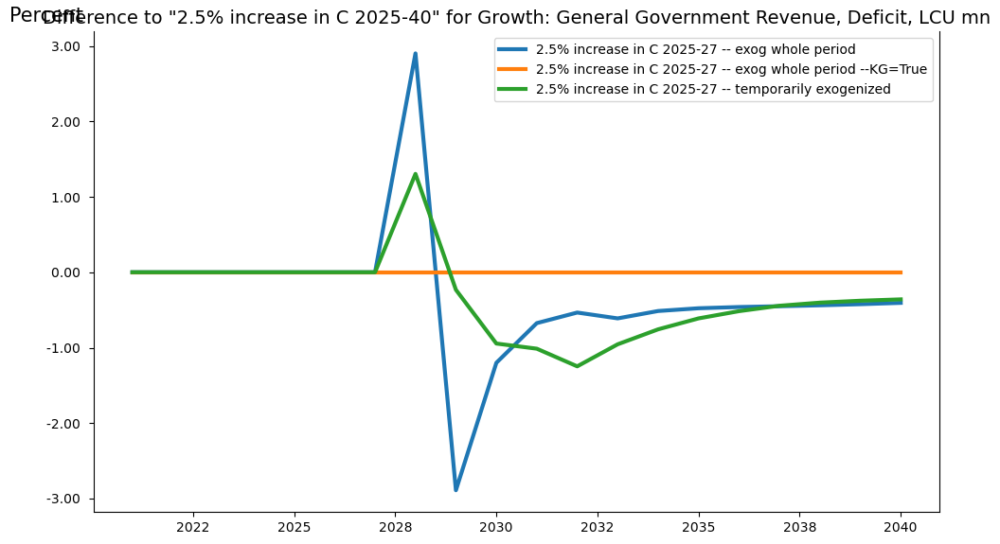

In [9]:

with mpak.keepswitch(scenarios='2.5% increase in C 2025-40|2.5% increase in C 2025-27 -- exog whole period|2.5% increase in C 2025-27 -- exog whole period --KG=True|2.5% increase in C 2025-27 -- temporarily exogenized'):
    mpak.keep_plot('PAKNYGDPMKTPKN PAKGGBALOVRLCN PAKGGDEBTTOTLCN',start=2020,end=2040,diff=True,showtype='growth',legend=True);

If, as before, the objective was to compare the four scenarios with the baseline scenario, the baseline scenario would have to be added to the .keep_switch() call as below:



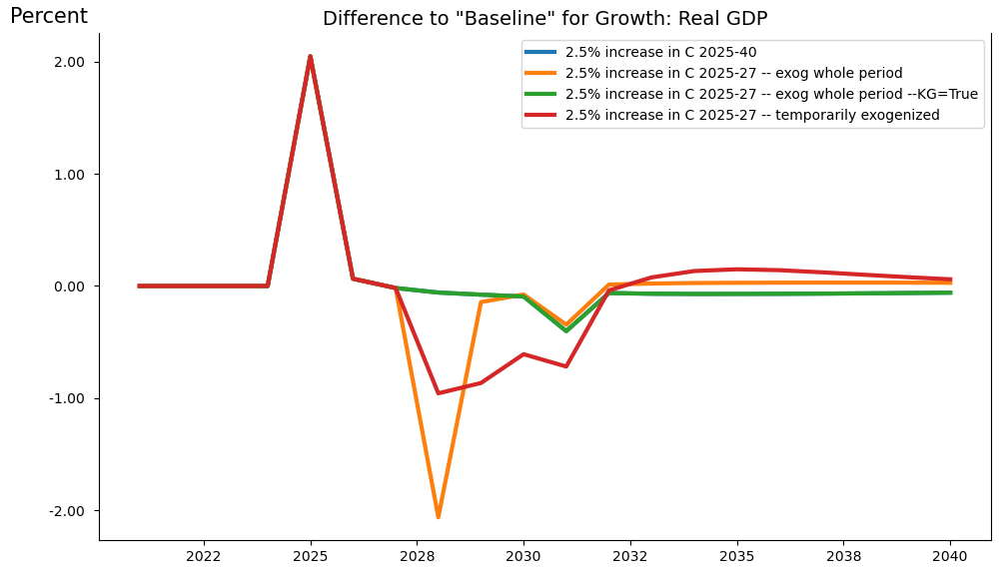

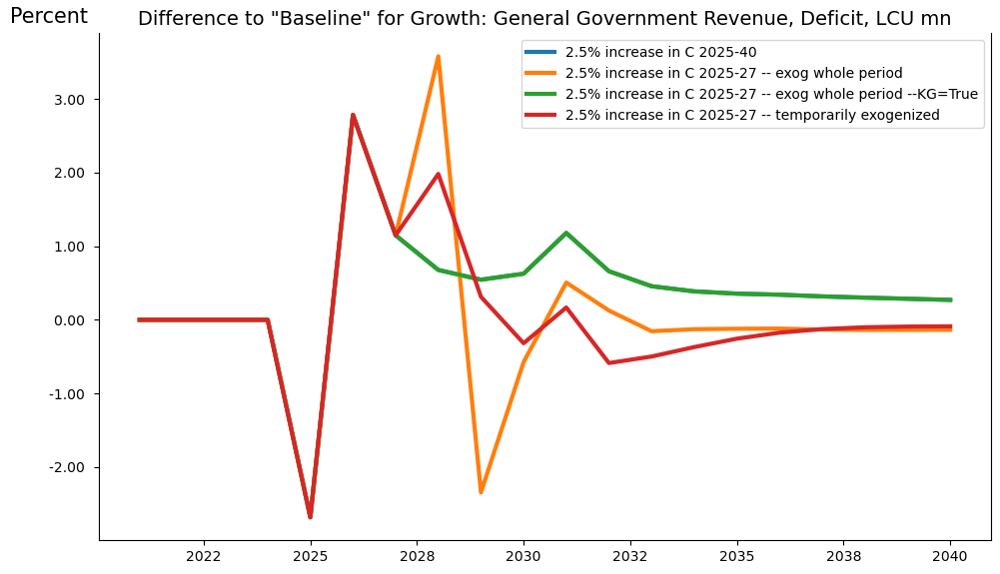

In [10]:

with mpak.keepswitch(scenarios='baseline|2.5% increase in C 2025-40|2.5% increase in C 2025-27 -- exog whole period|2.5% increase in C 2025-27 -- exog whole period --KG=True|2.5% increase in C 2025-27 -- temporarily exogenized'):
    mpak.keep_plot('PAKNYGDPMKTPKN PAKGGBALOVRLCN PAKGGDEBTTOTLCN',start=2020,end=2040,diff=True,showtype='growth',legend=True);

:::{warning} .keep_switch() and .keep_plot() with option diff=True
When the .keep_plot() option diff is set to True, the figures will be generated as comparisons with the values of the first scenario specified in the .keep_switch() command.  In most instances users will want to use the baseline scenario as this comparison point.  Failure to do so when this was the intention/expectation of the user, may generate unexpected results.

:::

:::{index} single: keep_switch; selection using wildcard
:::
:::{index} single: Simulations; Compare solutions - keep_switch with wildcard
:::
:::{index} single: Scenarios; Compare solutions - keep_switch with wildcard
:::



#### Keepswitch with wildcard selection

Below a series of plots are generated using a wildcard selector in the keepswitch clause.

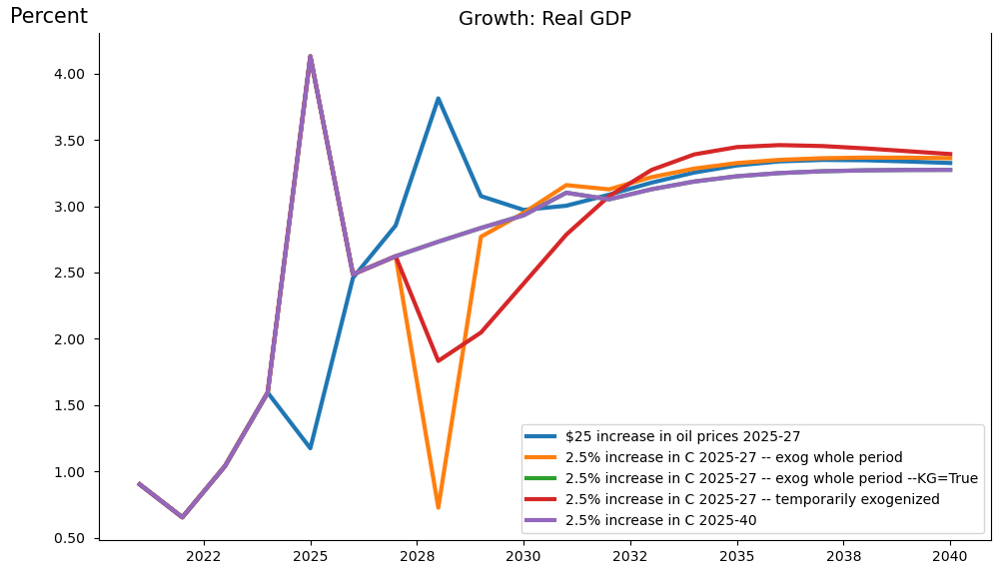

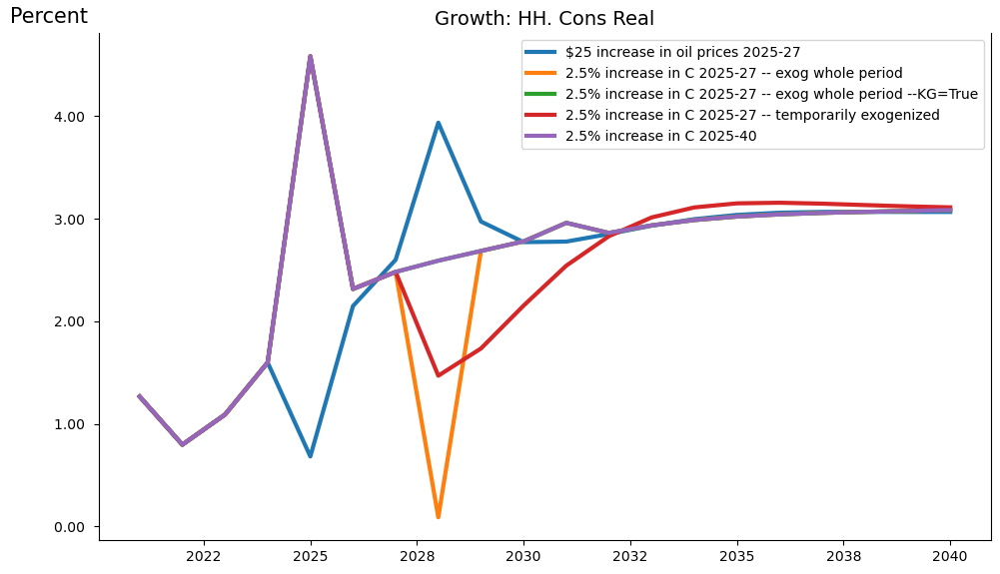

In [11]:

with mpak.keepswitch(scenarios='*2025*'):
    mpak.keep_plot('PAKNYGDPMKTPKN PAKNECONPRVTKN',showtype='growth',legend=True,start=2020,end=2040);

:::{index} single: Simulations; Report-writing keep_plot_multi - comparison of scenario results impacts on multiple series
:::
:::{index} single: Simulations; Compare solutions - comparison of scenario results impacts on multiple series
:::
:::{index} single: Scenarios; Report-writing keep_plot_multi - comparison of scenario results impacts on multiple series
:::
:::{index} single: Scenarios; Compare solutions - comparison of scenario results impacts on multiple series
:::
:::{index} single: Report-writing; .keep_plot_multi - comparison of scenario results impacts on multiple series
:::
:::{index} single:keep_plot_multi; comparison of scenario results impacts on multiple series
:::



## The `.keep_plot_multi()` method

The `.keep_plot_multi()` method allows several charts to be displayed in a grid.  The size of each chart can be set with the `size=(w,h)` option, where the units of with and height are in centimetres.  This call differs from .keep_plot() by displaying the difference of multiple variables from one scenario versus the initial scenario, versus the .keep_plot() which shows all scenarios for just one variable. 

:::{note} .Keep_plot vs .keep_plot_multi()

Both  .Keep_plot and .keep_plot_multi() display multiple graphs comparing results for one or more variables.

| Method | nature of displayed lines |
|:---|:---|
|.keep_plot()|One graph per series displayed, multiple scenarios on each graph|
|.keep_plot_multi()|Many different variables displayed on each graph, each emanating from a different scenario|

:::

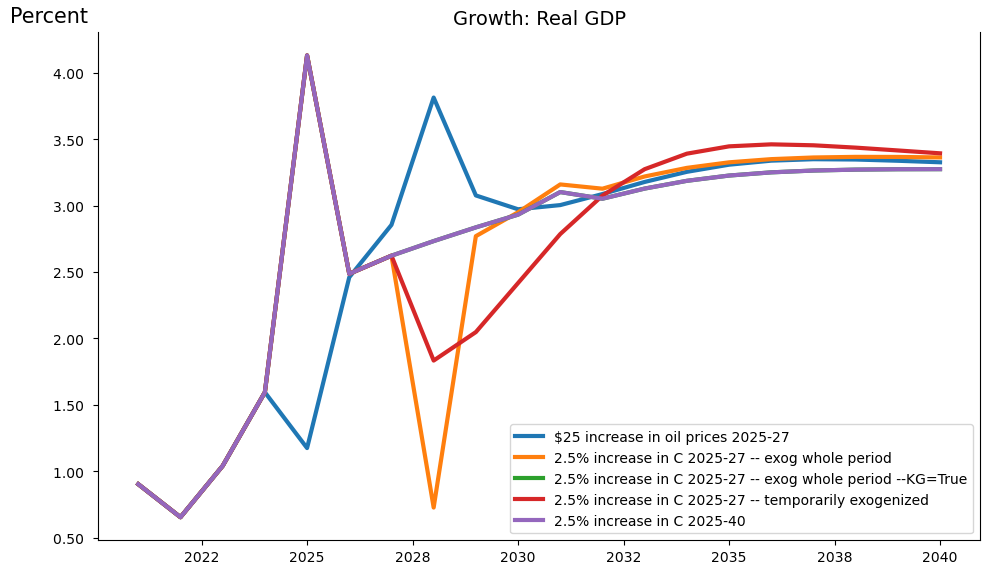

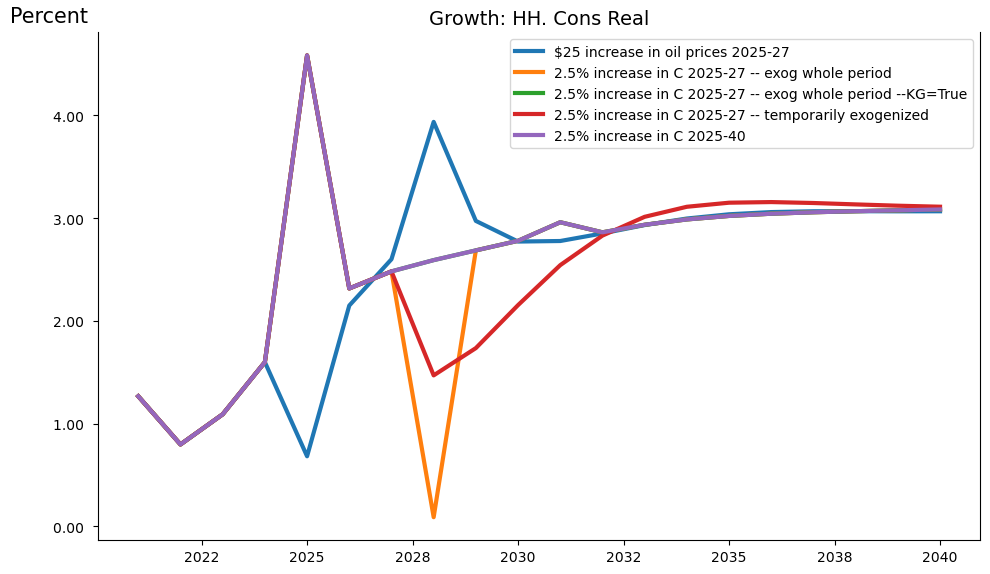

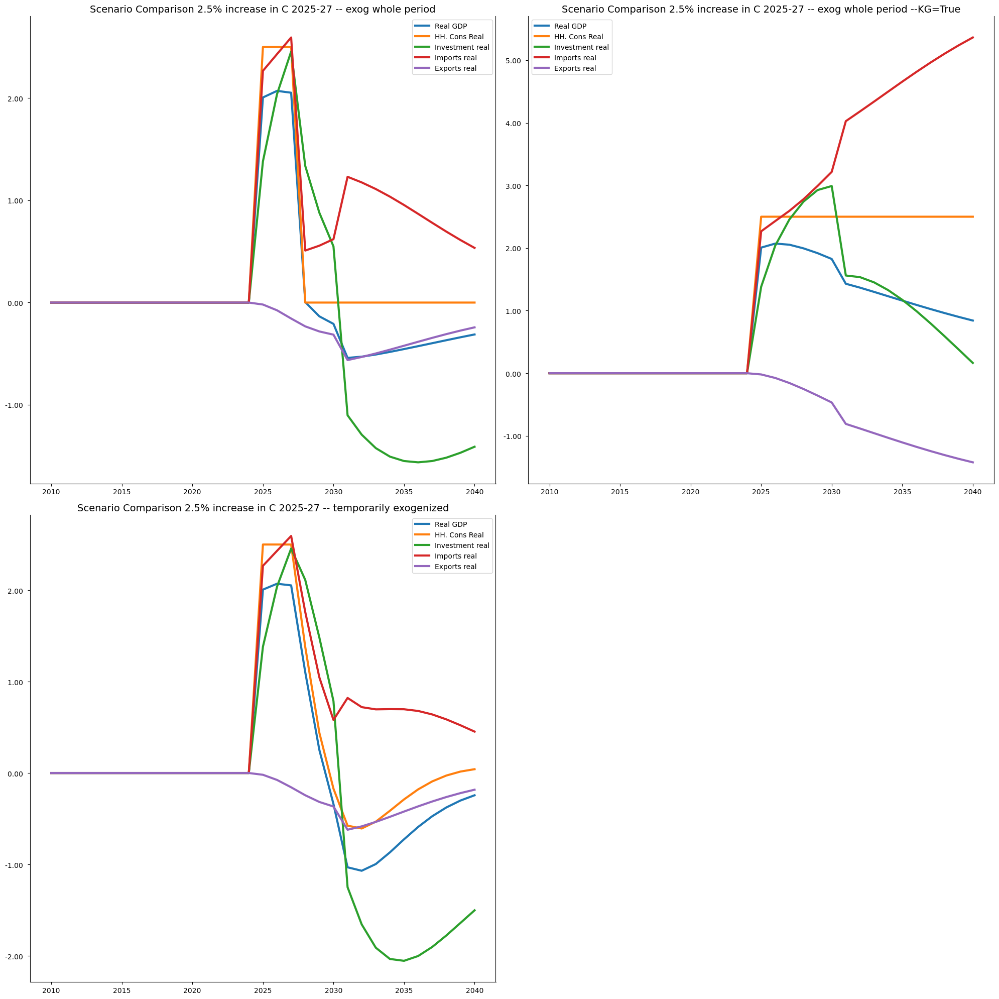

In [12]:
with mpak.set_smpl(2000,2040):
    with mpak.keepswitch(scenarios="baseline *exog*"):
        var_figs = mpak.keep_plot_multi('PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEGDIFTOTKN PAKNEIMPGNFSKN PAKNEEXPGNFSKN',2010,2040,keep_dim=0,legend=1
                                ,size=(20,20) ,diffpct=True,title='Scenario Comparison'  );

As indicated earlier both `keep_plot()` and `keep_plot_multi()` return a variable (a grid of mathplot figure objects) that can be used to embellish or modify the figures produced by the automatic routines.

For example the charts can be resized.

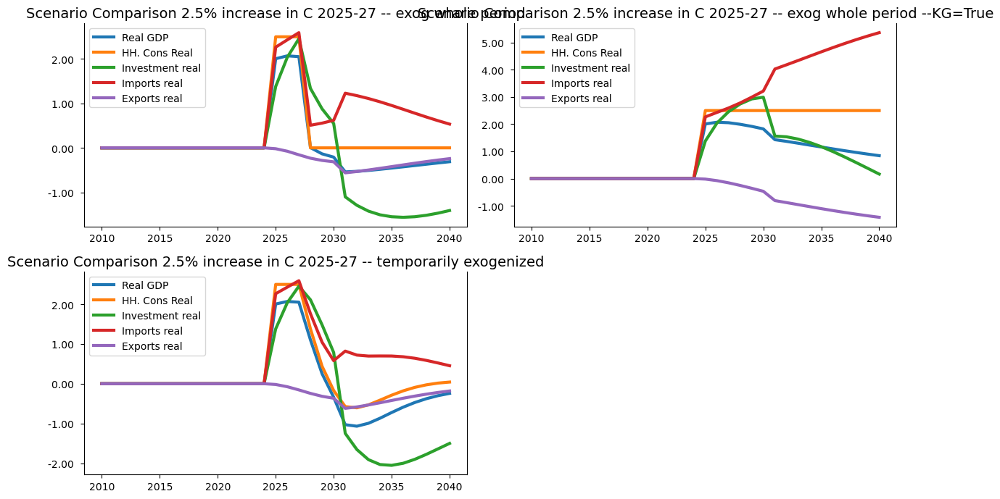

In [13]:
var_figs2=var_figs
var_figs2.set_size_inches(12,7)
var_figs2

Individual charts can be deleted from the grid.  

:::{note}
The grid representation of the individual charts is returned as a 0-based vector of charts.  Thus the first figure is the zeroeth and the second is the first.
:::

:::{index} single: Mathplotlib; plots - Delete figure from grid of charts 
:::
:::{index} single: Report-writing; Delete figure from grid of charts (mathplotlib functionality)
:::



### Delete a chart from the grid

A chart can be deleted from the grid by referencing it and calling the `.remove()` method. 

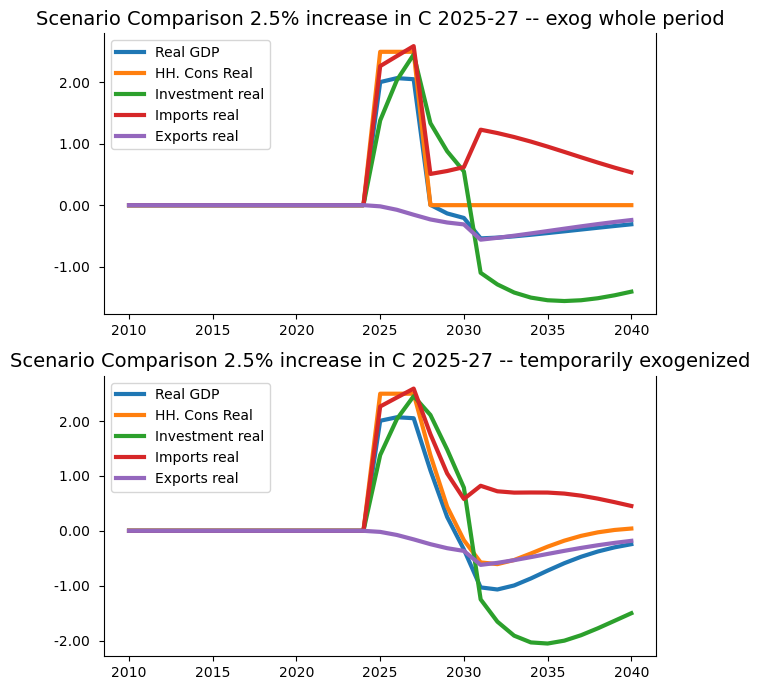

In [14]:
var_figs.axes[1].remove()
var_figs

The same mechanism can be used to revise the titles of the indidividual charts and annotate them.

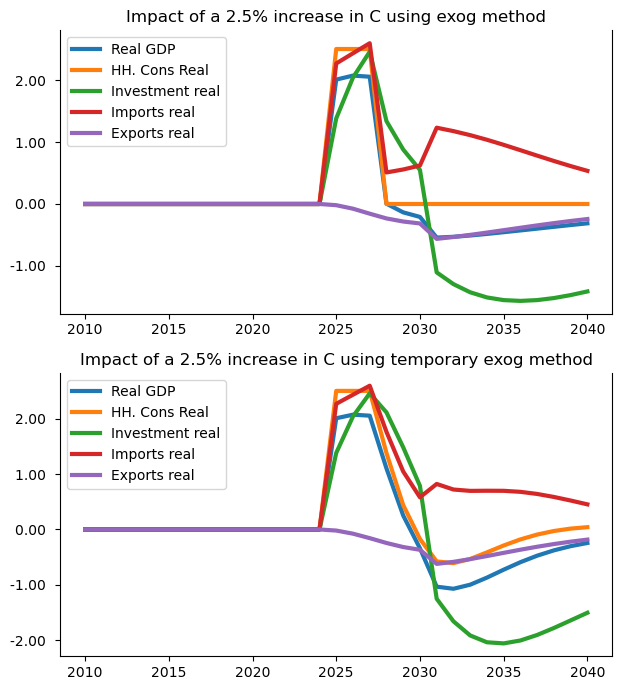

In [15]:
var_figs.axes[0].set_title('Impact of a 2.5% increase in C using exog method');    # many properties can be set afterward 
var_figs.axes[1].set_title('Impact of a 2.5% increase in C using temporary exog method');
var_figs

:::{index} single: Mathplotlib; revise charts after built
:::




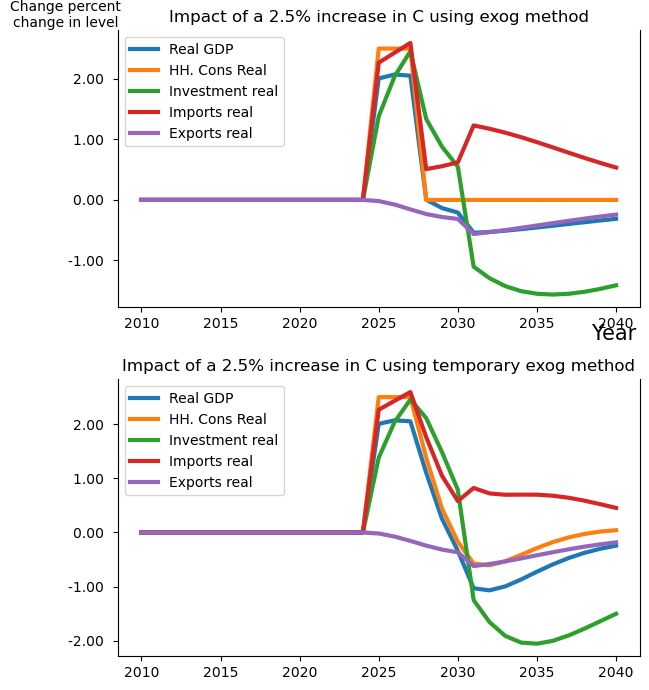

In [16]:
var_figs.axes[0].set_xlabel('Year')
var_figs.axes[0].set_ylabel('Change percent\nchange in level',fontsize=10)
var_figs.axes[0].yaxis.set_label_coords(-0.1,1.02)
var_figs.axes[0].xaxis.set_label_coords(.95,-.06)
var_figs

Variables pointing to the individual charts can be defined and used to make modifications to individual charts within the overall figure.



In [17]:
#del fig1
#del fig2
fig1=var_figs.axes[0]
fig2=var_figs.axes[1]


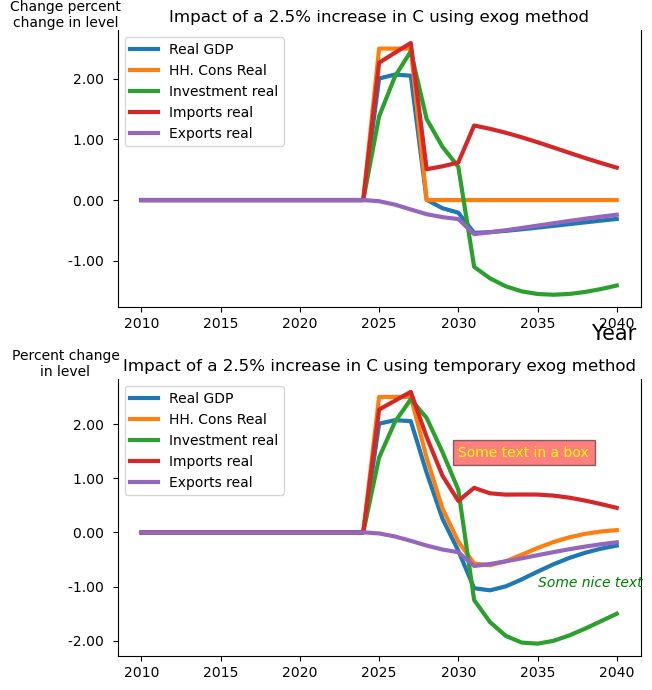

In [18]:
fig2.set_ylabel('Percent change\nin level',fontsize=10)
fig2.yaxis.set_label_coords(-0.1,1.02) #place axes labels
fig2.xaxis.set_label_coords(.95,-.06)



fig2.text(2030.,1.4, 'Some text in a box', 
          color='yellow',bbox=dict(facecolor='red', alpha=0.5));
fig2.text(2035.,-1., 'Some nice text', 
          style='italic',color='green');
          
var_figs
          

:::{index} single: keep_show(); interactive keep_plot
:::

(keep-show)=
## `.keep_show()` Interactive widget for keep_plot 
It can be a challenge to remember all variable names and options. Therefor a convenient interactive widget can be used to explore the kept scenarios. The most basic call is simply: 

```.keep_show()```

This will show a interactive widget which allows  the user to design scenario charts as shown below.  

In [22]:
mpak.keep_show(legend=1) 

:::{image} keep_show_1.png
    :alt: Menu to start notebooks in subfolders
    :class: bg-primary mb-1
    :width: 90%
    :align: center
:::   

:::{index} single: keep_show(); save chart to file
:::

### Save charts to file. 
When the `Allow save to file` checkbox is checked, an additional widget is displayed. This can be used to save the charts in a number of formats. As a default the charts are saved in `graph/experiment name`.  

:::{image} keep_show_file_save.png
    :alt: Menu to start notebooks in subfolders
    :class: bg-primary mb-1
    :width: 90%
    :align: center
:::   

### Settings 
There are a number of settings which allows the user to custom make the how much input the widget requires. 

| Parameter          | Type          | Description                                                                                       |
|--------------------|---------------|---------------------------------------------------------------------------------------------------|
| `smpl`             | Tuple         | The selected sample, a tuple with 2 elements, matching the dataframe index. Defaults to ('','').  |
| `use_smpl`         | False         | Show a sample selection slider.                                                                    |
| `selectfrom`       | List          | The variables to select from. Defaults to [] (all kept variables).                                |
| `legend`           | False          | Show legends or to the right of the curve.                                    |
| `dec`              | String        | Decimals on the y-axis. Defaults to '0'.                                                           |
| `use_descriptions` | True          | Use the variable descriptions from the model.                                                      |
| `vline`            | List          | List of vertical lines (position, text).                                                           |
| `add_var_name`     | False          | Add the variable name to description.                                                              |
| `short`            | 0, 1 or 2     | Short, 1 or 2 cut down on the input fields.                                                        |
| `select_scenario`  |True          | Allow selection of scenarios for which charts are displayed.                                                   |
| `switch`           | False          | Use the scenarios in `mmodel.basedf` and `mmodel.lastdf`.                                          |
| `var_groups`       | Dict          | A dictionary of variable patterns to select, e.g., countries.                                      |
| `use_var_groups`   | True          | Use the `var_groups`.                                                                              |
| `displaytype`      | String        | Display type, one of ['tab', 'accordion', 'anything'].                                             |
| `save_location`    | String        | Default save location.                                                                             |
| `relativ_start`    | Int           | Relative start.                                                                                    |
| `selected`         | String        | Selected item.                                                                                     |
| `select_width`     | String        | Width of the selection widget.                                                                     |
| `select_height`    | String        | Height of the selection widget.                                                                    |


### .keep_show() call with options
The following shows a call when the most used options has been set explicit. 

In [21]:
mpak.keep_show(
select_scenario = True,  # default = False, allow selection of scenarios to display 
use_smpl        = True,  # default = False, allow selection of display smpl 
use_descriptions= True, # default = True,  use descriptions from model  
add_var_name    = False, # default = False, add variable name to description
switch          = False, # default = False, use basedf and lastdf as scenarios
use_var_groups  = True,  # default = True, show selection menu based on var_groups 
var_groups      = mpak.var_groups,  # default = .var_groups Grouping of variable to be used.
selectfrom     = 'PAK*',  # default = '*' Select variables  
legend         = True, # Default= False show legend     
)